# GJ1214

In [1]:
from glob import glob
import ombre as om
import numpy as np
import matplotlib.pyplot as plt

In [2]:
name = 'GJ1214'
fnames = np.asarray(glob(f'/Users/ch/HST/data/{name}/*.fits'))
obs = om.Observation.from_files(fnames)

In [3]:
obs

GJ-1214 [23 Visits]

In [4]:
obs.fit_transit()

<AxesSubplot:xlabel='Phase', ylabel='$e^-s^{-1}$'>

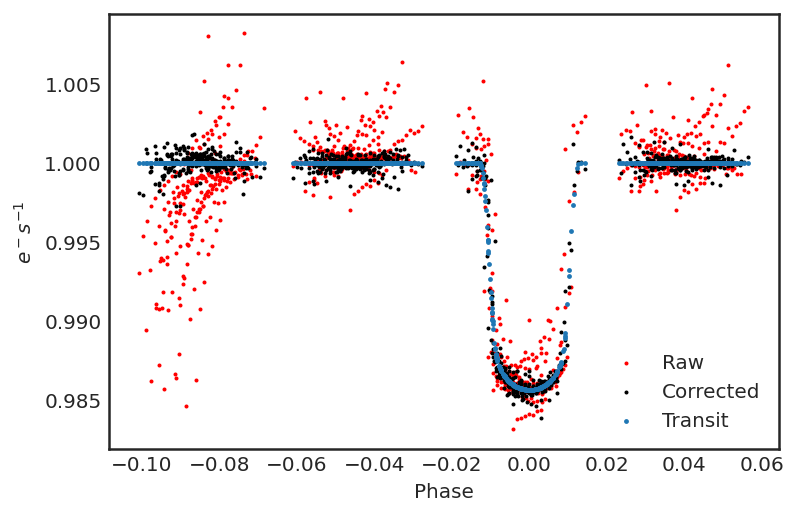

In [5]:
obs.plot()

In [6]:
obs.fit_model()

Fitting Transit/Eclipse Model:   0%|          | 0/23 [00:00<?, ?it/s]

Fitting Transit/Eclipse Model:   4%|▍         | 1/23 [00:16<06:01, 16.45s/it]

Fitting Transit/Eclipse Model:   9%|▊         | 2/23 [00:33<05:47, 16.56s/it]

Fitting Transit/Eclipse Model:  13%|█▎        | 3/23 [00:50<05:34, 16.72s/it]

Fitting Transit/Eclipse Model:  17%|█▋        | 4/23 [01:07<05:21, 16.91s/it]

Fitting Transit/Eclipse Model:  22%|██▏       | 5/23 [01:24<05:04, 16.89s/it]

Fitting Transit/Eclipse Model:  26%|██▌       | 6/23 [01:35<04:14, 15.00s/it]

Fitting Transit/Eclipse Model:  30%|███       | 7/23 [01:45<03:32, 13.27s/it]

Fitting Transit/Eclipse Model:  35%|███▍      | 8/23 [01:56<03:10, 12.71s/it]

Fitting Transit/Eclipse Model:  39%|███▉      | 9/23 [02:05<02:42, 11.57s/it]

Fitting Transit/Eclipse Model:  43%|████▎     | 10/23 [02:15<02:24, 11.08s/it]

Fitting Transit/Eclipse Model:  48%|████▊     | 11/23 [02:25<02:09, 10.78s/it]

Fitting Transit/Eclipse Model:  52%|█████▏    | 12/23 [02:35<01:53, 10.34s/it]

Fitting Transit/Eclipse Model:  57%|█████▋    | 13/23 [02:44<01:39,  9.91s/it]

Fitting Transit/Eclipse Model:  61%|██████    | 14/23 [02:54<01:29,  9.98s/it]

Fitting Transit/Eclipse Model:  65%|██████▌   | 15/23 [03:02<01:16,  9.55s/it]

Fitting Transit/Eclipse Model:  70%|██████▉   | 16/23 [03:11<01:05,  9.34s/it]

Fitting Transit/Eclipse Model:  74%|███████▍  | 17/23 [03:20<00:55,  9.26s/it]

Fitting Transit/Eclipse Model:  78%|███████▊  | 18/23 [03:29<00:46,  9.28s/it]

Fitting Transit/Eclipse Model:  83%|████████▎ | 19/23 [03:38<00:36,  9.18s/it]

Fitting Transit/Eclipse Model:  87%|████████▋ | 20/23 [03:47<00:27,  9.12s/it]

Fitting Transit/Eclipse Model:  91%|█████████▏| 21/23 [03:57<00:18,  9.22s/it]

Fitting Transit/Eclipse Model:  96%|█████████▌| 22/23 [04:06<00:09,  9.13s/it]

Fitting Transit/Eclipse Model: 100%|██████████| 23/23 [04:15<00:00,  9.15s/it]

Fitting Transit/Eclipse Model: 100%|██████████| 23/23 [04:15<00:00, 11.11s/it]

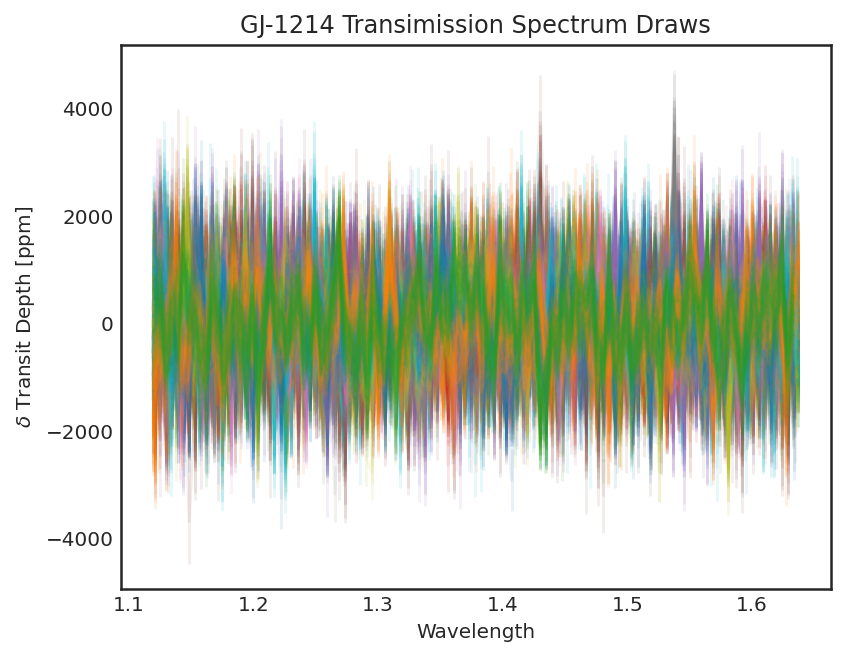

In [7]:
obs.plot_spectra()

<AxesSubplot:title={'center':'GJ-1214 Transmission Spectrum, Visit: 3'}, xlabel='Wavelength', ylabel='$\\delta$ Transit Depth [ppm]'>

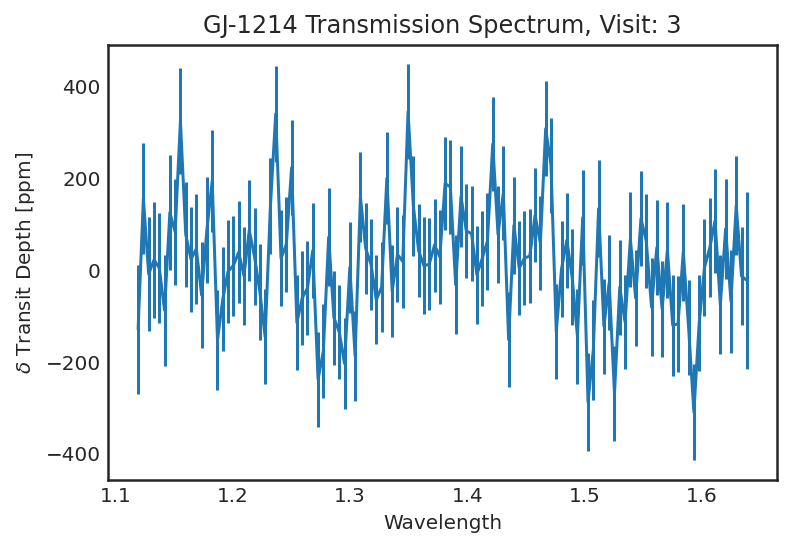

In [8]:
om.Spectra([visit.transmission_spectrum for visit in obs]).flatten().bin(bins=np.linspace(0.8, 1.7, 200)).plot()

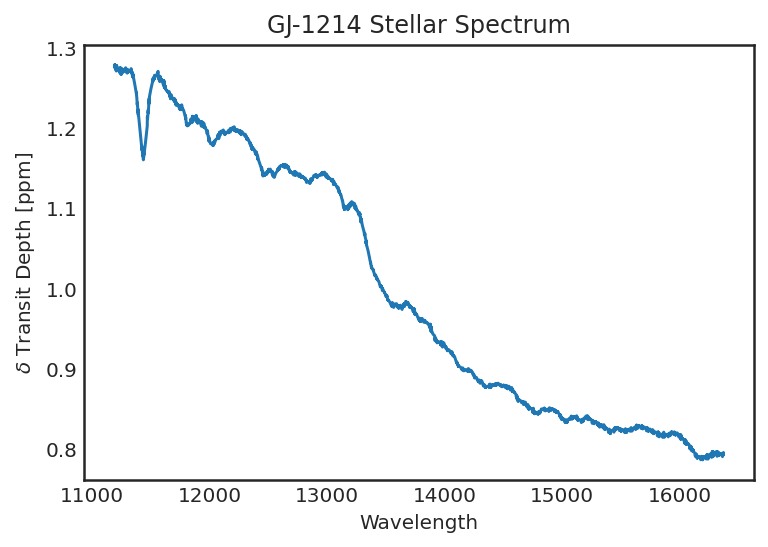

In [9]:
spec = obs.stellar_spectra
spec.plot()
spec.hdulist.writeto(f'results/{name}_stellar_spectrum.fits', overwrite=True)

In [10]:
from astropy.io import fits
try:
    hdulist = om.Spectra([visit.transmission_spectrum for visit in obs if visit.transmission_spectrum.spec.sum() != 0]).hdulist
    hdulist.writeto(f'results/{name}_transmission.fits')
except:
    pass
try:    
    hdulist = om.Spectra([visit.emission_spectrum for visit in obs if visit.emission_spectrum.spec.sum() != 0]).hdulist
    hdulist.writeto(f'results/{name}_emission.fits')
except:
    pass

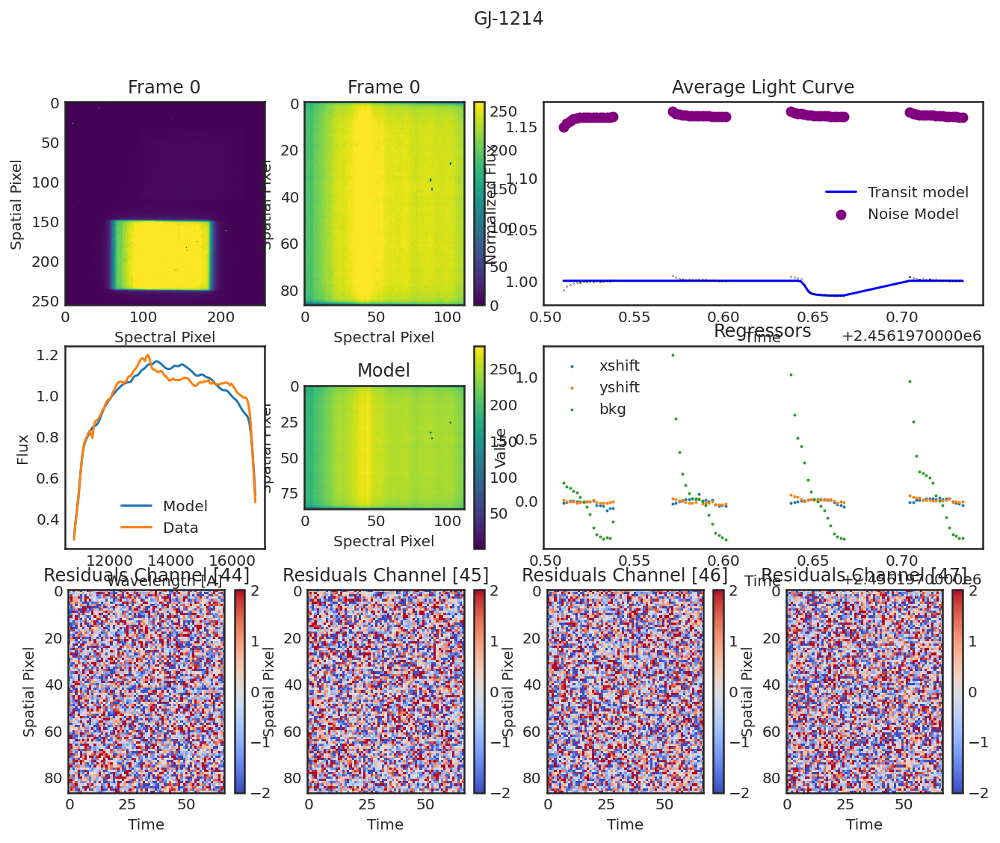

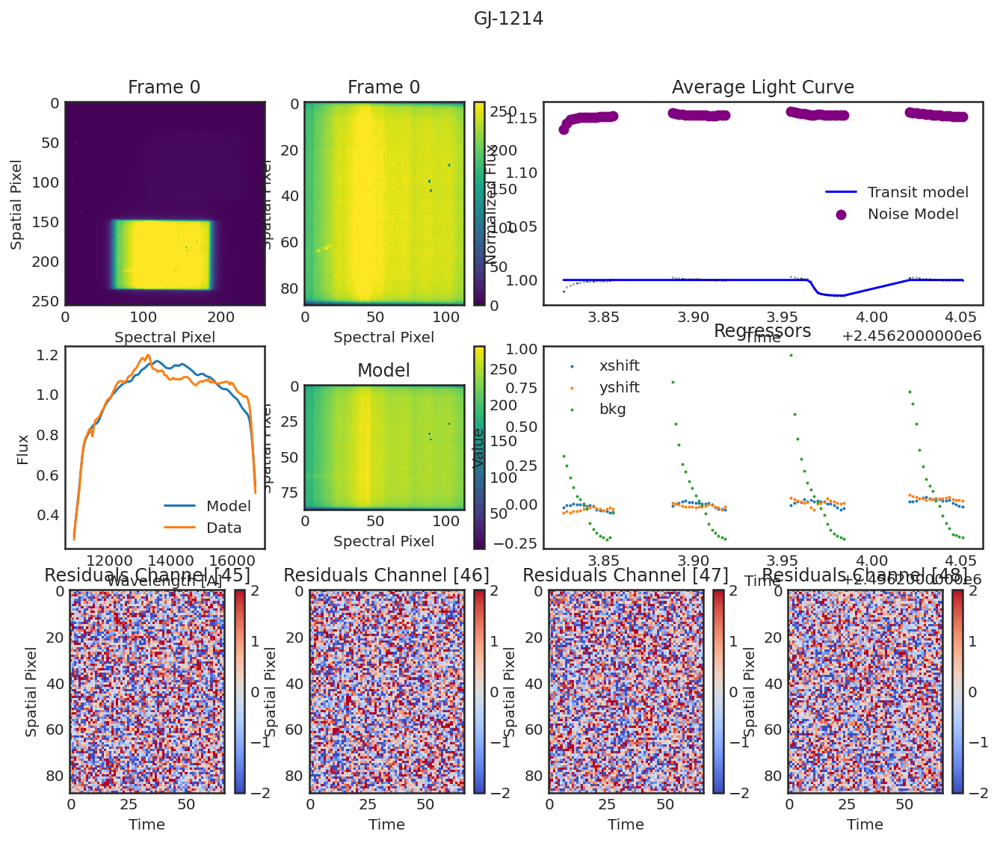

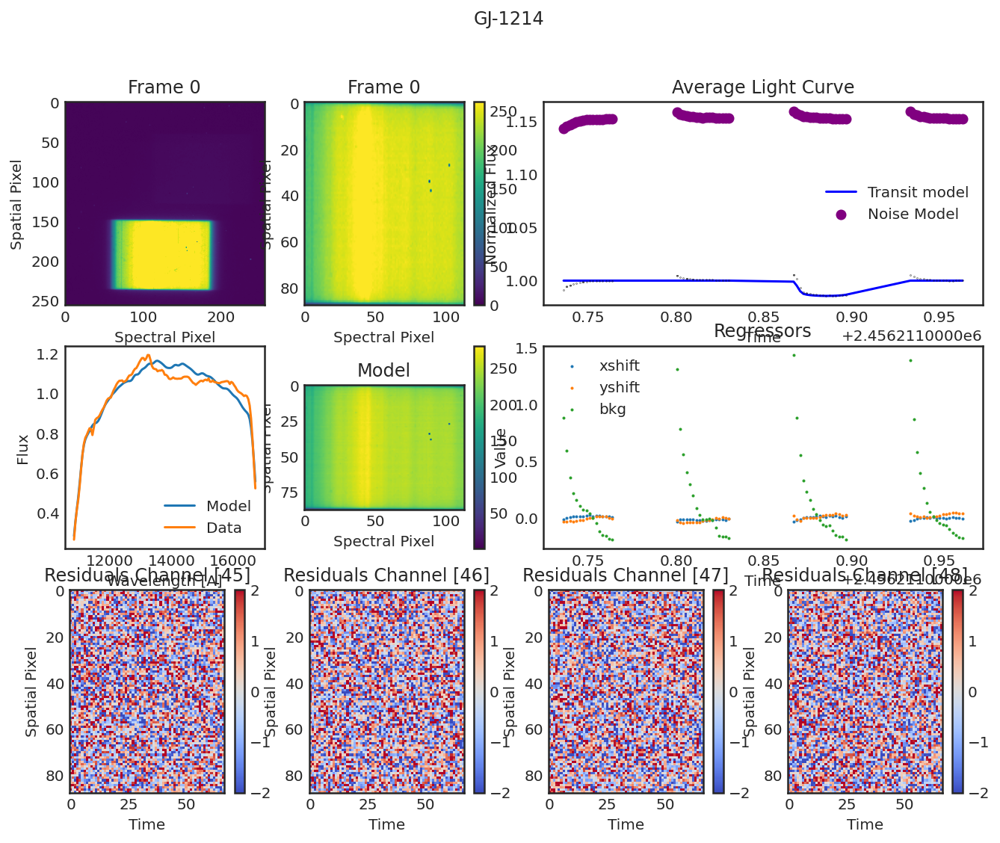

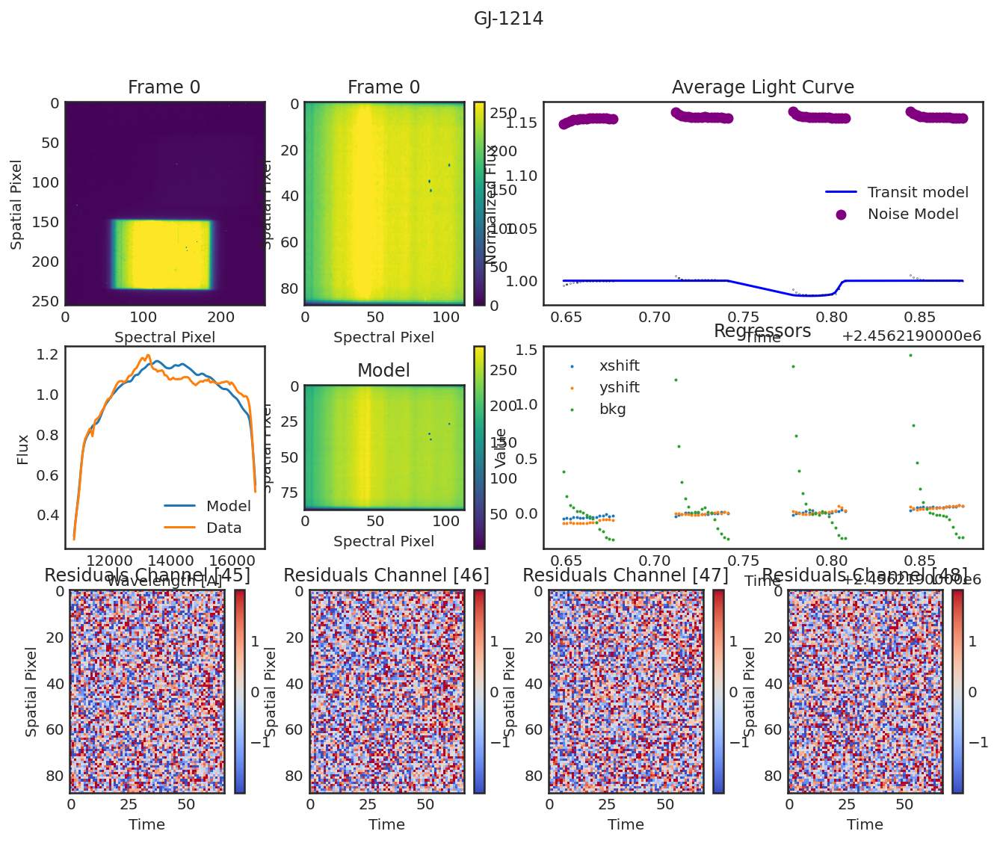

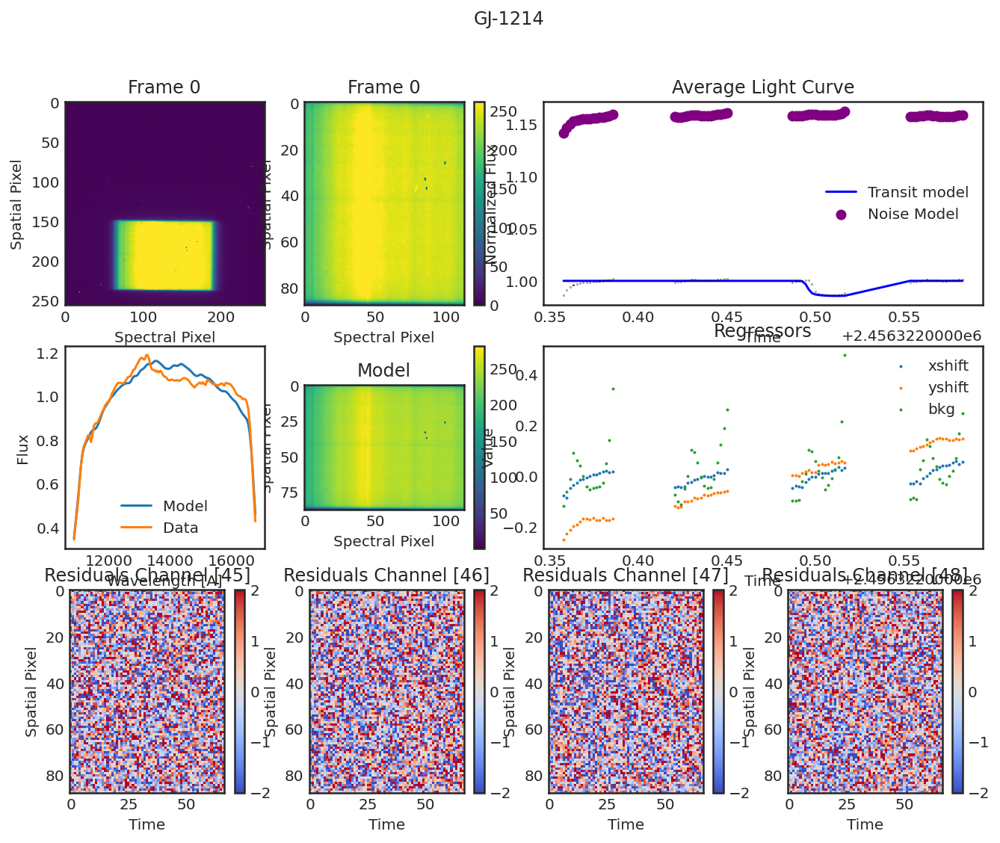

...

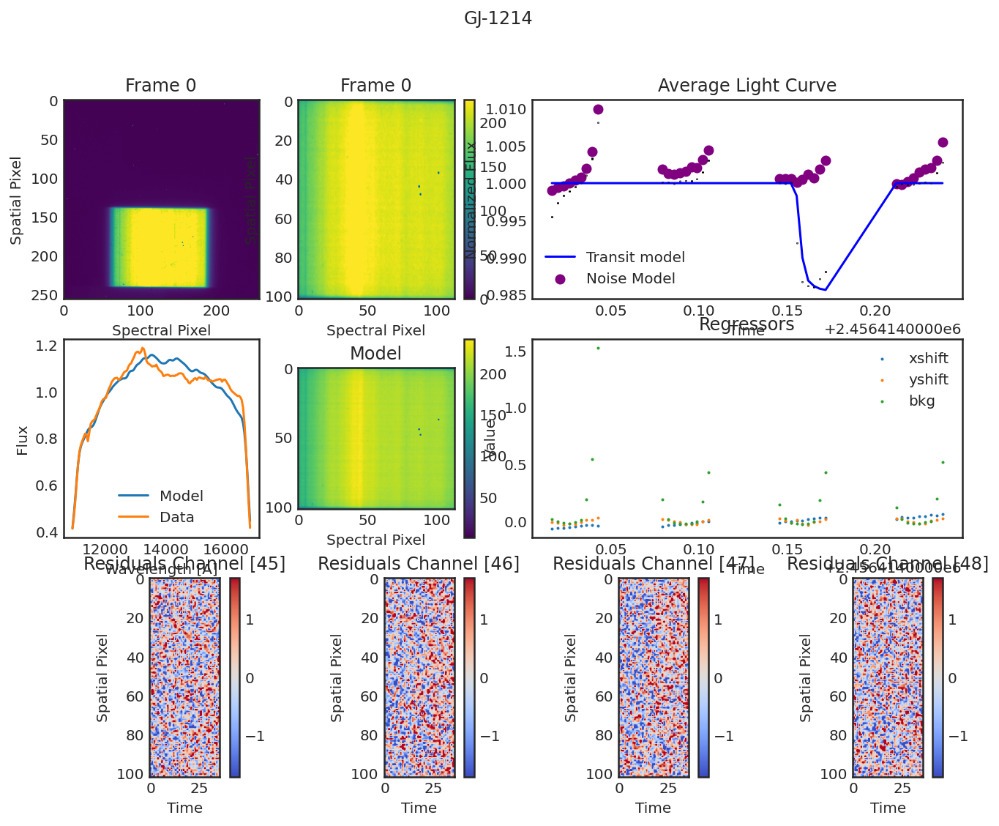

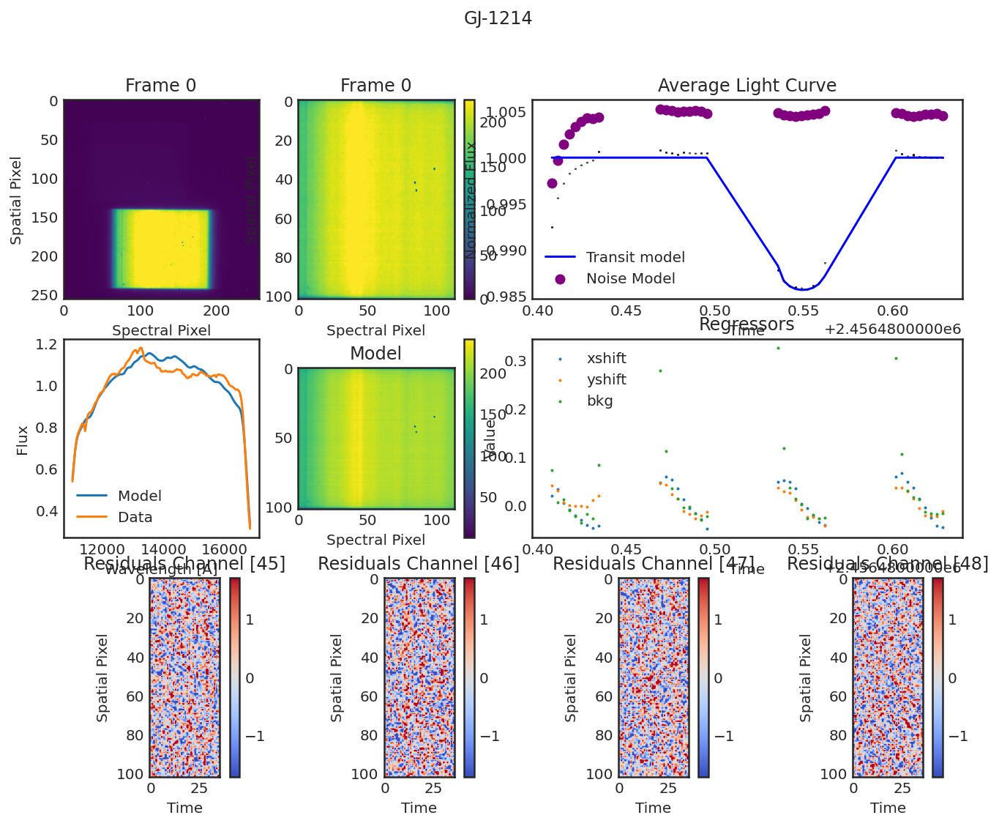

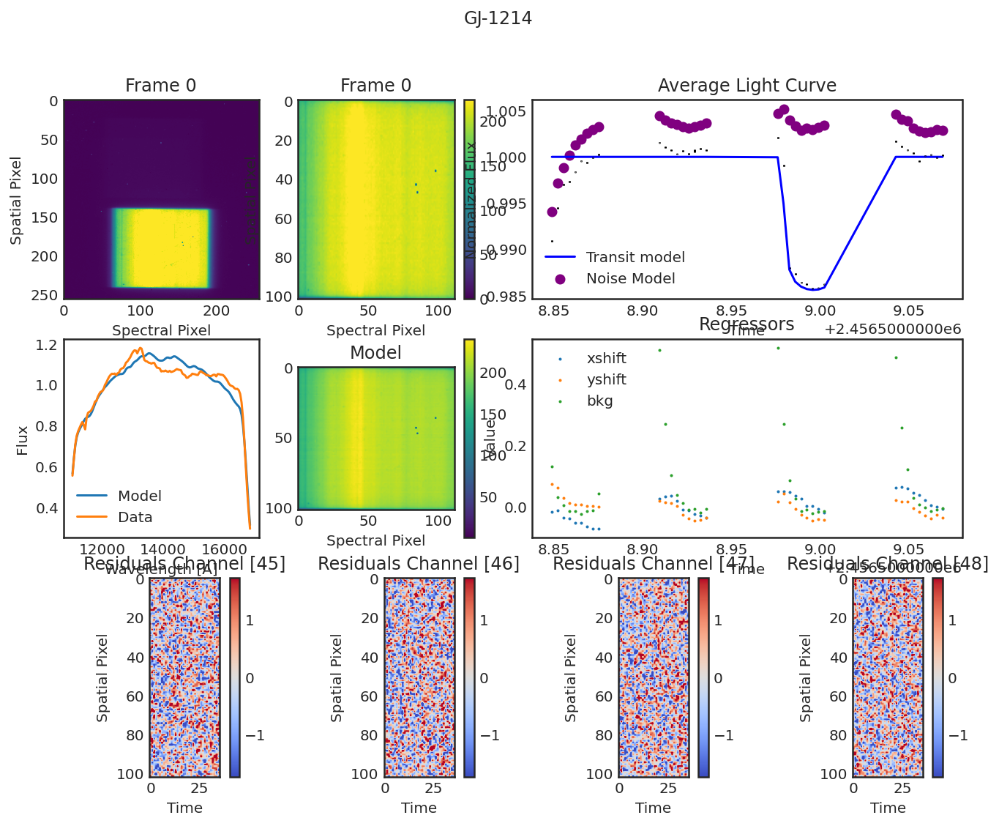

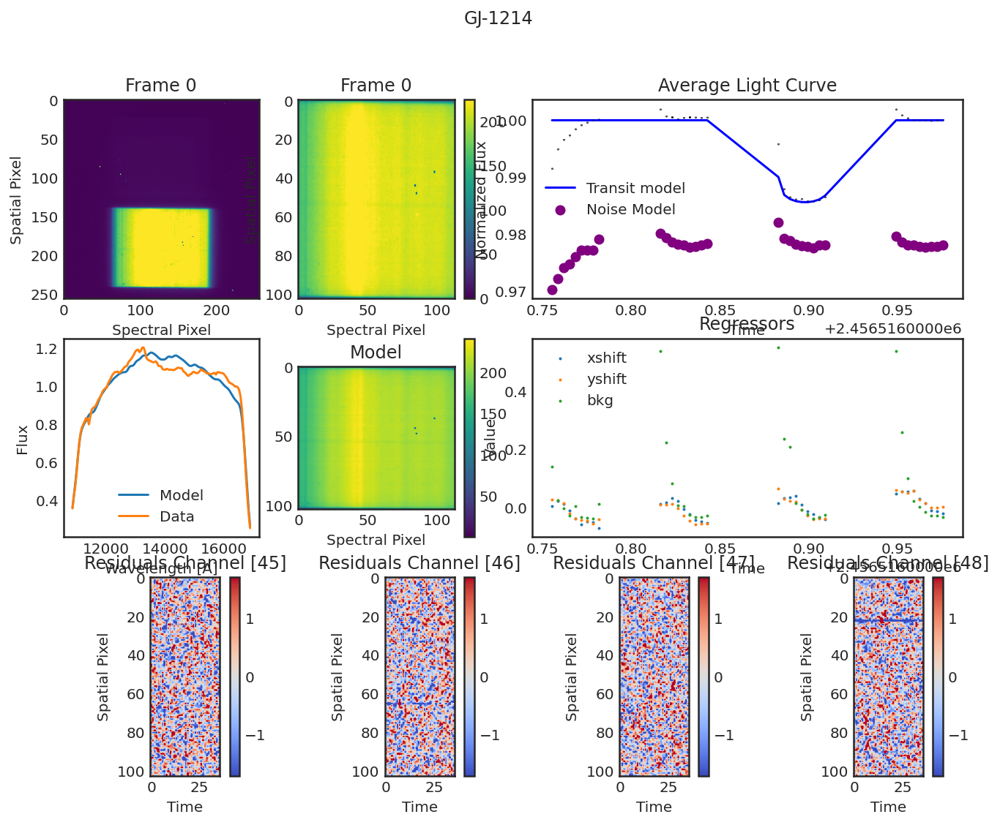

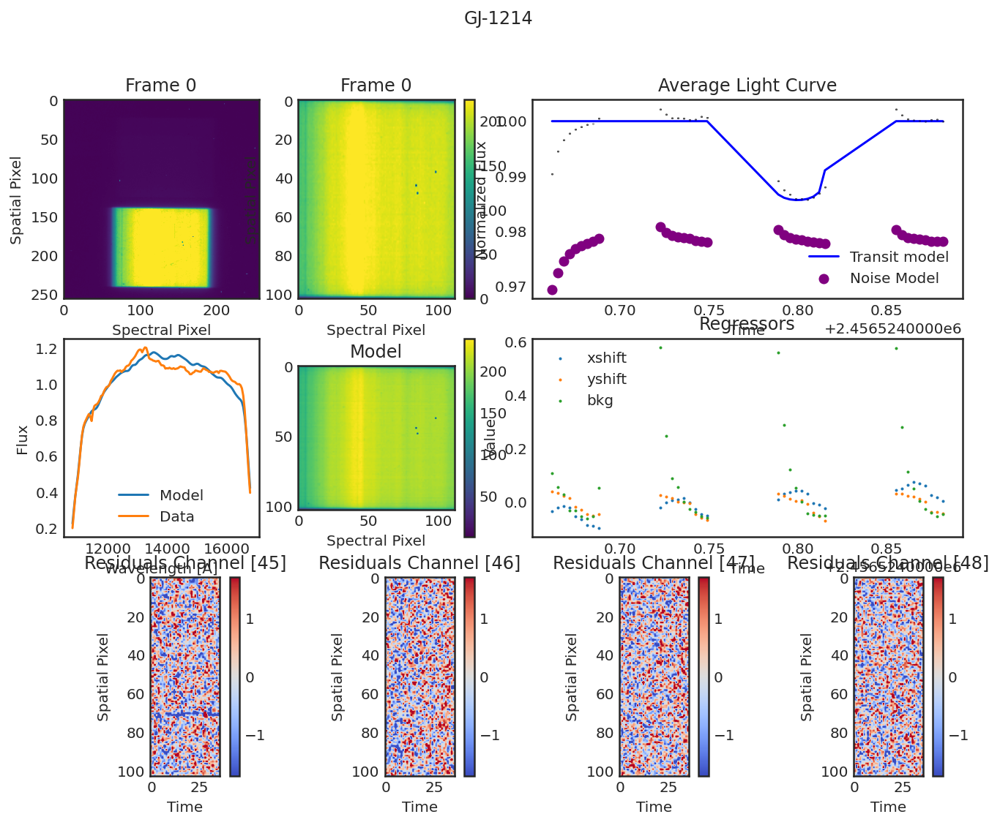

In [11]:
for visit in obs:
    visit.diagnose();
    plt.show();